### Functionalities

- Estimated Returns
    - Equal Weighted (Done)
    - Exponentially Weighteded (Done)
    
- Covariance (Semivariance/Full Variance) (Exponential Return VS Equal Weighted) (Done)
    - sklearn.covariance (all the techniques)
    - GARCH


    
### Objectives

- Sharpe Ratio
- Minimum Variance
- Efficient Frontier Simulation
- Maximum Diversification
- Targeted Combination
- Calmar Ratio
- Information Ratio
- Sortino Ratio
- Weight Constraints (Short-Selling & Leverage, Interest Charge + Transaction Cost)

### Other considerations

- No discrete allocation
- No penalization
- Backtest with Quantopian


In [322]:
import numpy as np
import pandas as pd
import sklearn as sk
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl

In [147]:
from pypfopt import risk_models

In [148]:
sp500 = pd.read_csv("sp500_modified.csv")

In [153]:
sp500 = sp500.drop(['Unnamed: 0'], axis=1).set_index('DATE')

In [162]:
selected = sp500.iloc[:, np.random.randint(1,200,10)]

In [167]:
selected_return = selected.pct_change().dropna(how='any')

In [168]:
selected_return.head()

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
DATE,,,,,,,,,,
1/3/1990,0.008286,0.016573,0.015707,0.003528,-0.001185,-0.026723,0.016693,-0.004170,0.003549,-0.005042
1/4/1990,-0.002735,-0.005550,0.015464,0.031696,-0.014235,-0.019601,0.024550,-0.008368,0.014012,0.000000
1/5/1990,-0.010989,-0.008022,0.012694,0.013652,-0.030084,0.000000,-0.007987,-0.004216,-0.006909,0.000000
1/8/1990,-0.002780,-0.005626,-0.010025,0.000000,-0.006204,-0.008013,0.008052,0.004234,-0.010470,0.000000
1/9/1990,-0.016717,-0.022100,-0.012662,-0.020202,-0.006242,-0.012103,-0.007987,-0.004216,-0.019369,-0.010152


In [180]:
risk_models.semicovariance(selected)

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,0.042986,0.005043,0.005817,0.008075,0.006817,0.005347,0.007783,0.005207,0.006395,0.002739
GD,0.005043,0.031017,0.004886,0.006848,0.005566,0.003231,0.005896,0.003320,0.004011,0.001987
UNM,0.005817,0.004886,0.054734,0.006886,0.008787,0.004764,0.009937,0.005034,0.006626,0.003012
HON,0.008075,0.006848,0.006886,0.033052,0.007779,0.006111,0.010154,0.005165,0.006465,0.003599
AIG,0.006817,0.005566,0.008787,0.007779,0.020909,0.005665,0.009067,0.003905,0.007333,0.003327
SYY,0.005347,0.003231,0.004764,0.006111,0.005665,0.023552,0.004606,0.002752,0.005757,0.002480
TROW,0.007783,0.005896,0.009937,0.010154,0.009067,0.004606,0.053305,0.005235,0.008354,0.004166
OXY,0.005207,0.003320,0.005034,0.005165,0.003905,0.002752,0.005235,0.026475,0.004107,0.002346
PFE,0.006395,0.004011,0.006626,0.006465,0.007333,0.005757,0.008354,0.004107,0.030069,0.001682
AJG,0.002739,0.001987,0.003012,0.003599,0.003327,0.002480,0.004166,0.002346,0.001682,0.018321


In [186]:
risk_models.exp_cov(selected[:180])

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,0.051148,0.007076,0.022099,0.028430,0.024431,0.036161,0.019924,0.022350,0.024627,-0.000129
GD,0.007076,0.075120,-0.003221,0.002512,-0.000633,0.007536,0.006188,0.009670,-0.000115,-0.002310
UNM,0.022099,-0.003221,0.066507,0.017646,0.025880,0.036372,0.018549,0.020094,0.021138,0.002348
HON,0.028430,0.002512,0.017646,0.065128,0.023856,0.042015,0.012304,0.013531,0.028420,-0.002494
AIG,0.024431,-0.000633,0.025880,0.023856,0.050898,0.033948,0.010566,0.012410,0.027259,0.002191
SYY,0.036161,0.007536,0.036372,0.042015,0.033948,0.104597,0.024351,0.030195,0.039925,-0.004987
TROW,0.019924,0.006188,0.018549,0.012304,0.010566,0.024351,0.106985,0.021288,0.016552,0.005516
OXY,0.022350,0.009670,0.020094,0.013531,0.012410,0.030195,0.021288,0.052071,0.015154,0.000191
PFE,0.024627,-0.000115,0.021138,0.028420,0.027259,0.039925,0.016552,0.015154,0.074227,-0.004186
AJG,-0.000129,-0.002310,0.002348,-0.002494,0.002191,-0.004987,0.005516,0.000191,-0.004186,0.019614


In [195]:
covgen = CovarianceGenerator(selected_return)
covgen.calc_cov_mat(technique='sample', semi=False, method='default', unit_time=252, bm_return=0.000079, assume_zero=True)

In [240]:
selected.pct_change().dropna(how='any').cov()

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,0.000433,0.000055,0.000065,0.000097,0.000095,0.000075,0.000099,0.000056,0.000070,0.000037
GD,0.000055,0.000350,0.000043,0.000068,0.000062,0.000040,0.000059,0.000038,0.000046,0.000022
UNM,0.000065,0.000043,0.000478,0.000091,0.000114,0.000071,0.000112,0.000047,0.000060,0.000044
HON,0.000097,0.000068,0.000091,0.000398,0.000100,0.000074,0.000108,0.000053,0.000064,0.000044
AIG,0.000095,0.000062,0.000114,0.000100,0.000268,0.000082,0.000128,0.000037,0.000095,0.000055
SYY,0.000075,0.000040,0.000071,0.000074,0.000082,0.000293,0.000080,0.000031,0.000085,0.000032
TROW,0.000099,0.000059,0.000112,0.000108,0.000128,0.000080,0.000712,0.000035,0.000093,0.000066
OXY,0.000056,0.000038,0.000047,0.000053,0.000037,0.000031,0.000035,0.000298,0.000042,0.000021
PFE,0.000070,0.000046,0.000060,0.000064,0.000095,0.000085,0.000093,0.000042,0.000361,0.000018
AJG,0.000037,0.000022,0.000044,0.000044,0.000055,0.000032,0.000066,0.000021,0.000018,0.000243


In [242]:
risk_models.sample_cov(selected)

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,0.108991,0.013795,0.016438,0.024536,0.023893,0.018834,0.024865,0.014122,0.017621,0.009280
GD,0.013795,0.088089,0.010946,0.017070,0.015561,0.009973,0.014768,0.009575,0.011689,0.005528
UNM,0.016438,0.010946,0.120362,0.022887,0.028787,0.017799,0.028349,0.011962,0.015145,0.011142
HON,0.024536,0.017070,0.022887,0.100384,0.025140,0.018665,0.027129,0.013301,0.016070,0.011089
AIG,0.023893,0.015561,0.028787,0.025140,0.067660,0.020587,0.032297,0.009341,0.023815,0.013969
SYY,0.018834,0.009973,0.017799,0.018665,0.020587,0.073828,0.020095,0.007773,0.021295,0.007984
TROW,0.024865,0.014768,0.028349,0.027129,0.032297,0.020095,0.179335,0.008913,0.023441,0.016515
OXY,0.014122,0.009575,0.011962,0.013301,0.009341,0.007773,0.008913,0.075061,0.010503,0.005381
PFE,0.017621,0.011689,0.015145,0.016070,0.023815,0.021295,0.023441,0.010503,0.091044,0.004490
AJG,0.009280,0.005528,0.011142,0.011089,0.013969,0.007984,0.016515,0.005381,0.004490,0.061154


In [203]:
pd.DataFrame(covgen.cov_mat, index=covgen.assets, columns=covgen.assets)

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,0.108991,0.013795,0.016438,0.024536,0.023893,0.018834,0.024865,0.014122,0.017621,0.009280
GD,0.013795,0.088089,0.010946,0.017070,0.015561,0.009973,0.014768,0.009575,0.011689,0.005528
UNM,0.016438,0.010946,0.120362,0.022887,0.028787,0.017799,0.028349,0.011962,0.015145,0.011142
HON,0.024536,0.017070,0.022887,0.100384,0.025140,0.018665,0.027129,0.013301,0.016070,0.011089
AIG,0.023893,0.015561,0.028787,0.025140,0.067660,0.020587,0.032297,0.009341,0.023815,0.013969
SYY,0.018834,0.009973,0.017799,0.018665,0.020587,0.073828,0.020095,0.007773,0.021295,0.007984
TROW,0.024865,0.014768,0.028349,0.027129,0.032297,0.020095,0.179335,0.008913,0.023441,0.016515
OXY,0.014122,0.009575,0.011962,0.013301,0.009341,0.007773,0.008913,0.075061,0.010503,0.005381
PFE,0.017621,0.011689,0.015145,0.016070,0.023815,0.021295,0.023441,0.010503,0.091044,0.004490
AJG,0.009280,0.005528,0.011142,0.011089,0.013969,0.007984,0.016515,0.005381,0.004490,0.061154


In [272]:
risk_models.sample_cov(selected)/np.dot(selected_return.values.T.std(axis=1).T.reshape(-1,1), selected_return.values.T.std(axis=1).reshape(1,-1))/252

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,1.000349,0.140836,0.143566,0.234655,0.278333,0.210032,0.177918,0.156186,0.176957,0.113704
GD,0.140836,1.000349,0.106343,0.181594,0.201635,0.123711,0.117541,0.117795,0.130565,0.075348
UNM,0.143566,0.106343,1.000349,0.208289,0.319109,0.188888,0.193021,0.125898,0.144732,0.129915
HON,0.234655,0.181594,0.208289,1.000349,0.305156,0.216893,0.202266,0.153283,0.168159,0.141576
AIG,0.278333,0.201635,0.319109,0.305156,1.000349,0.291380,0.293299,0.131118,0.303540,0.217242
SYY,0.210032,0.123711,0.188888,0.216893,0.291380,1.000349,0.174700,0.104450,0.259835,0.118864
TROW,0.177918,0.117541,0.193021,0.202266,0.293299,0.174700,1.000349,0.076851,0.183511,0.157753
OXY,0.156186,0.117795,0.125898,0.153283,0.131118,0.104450,0.076851,1.000349,0.127094,0.079445
PFE,0.176957,0.130565,0.144732,0.168159,0.303540,0.259835,0.183511,0.127094,1.000349,0.060193
AJG,0.113704,0.075348,0.129915,0.141576,0.217242,0.118864,0.157753,0.079445,0.060193,1.000349


In [263]:
cov_mat = risk_models.sample_cov(selected)

In [280]:
selected.pct_change().corr()

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,1.000000,0.140787,0.143516,0.234573,0.278236,0.209958,0.177856,0.156131,0.176895,0.113665
GD,0.140787,1.000000,0.106306,0.181531,0.201565,0.123668,0.117500,0.117754,0.130519,0.075322
UNM,0.143516,0.106306,1.000000,0.208216,0.318998,0.188822,0.192954,0.125855,0.144681,0.129870
HON,0.234573,0.181531,0.208216,1.000000,0.305050,0.216817,0.202196,0.153229,0.168100,0.141526
AIG,0.278236,0.201565,0.318998,0.305050,1.000000,0.291279,0.293197,0.131072,0.303434,0.217166
SYY,0.209958,0.123668,0.188822,0.216817,0.291279,1.000000,0.174639,0.104414,0.259744,0.118822
TROW,0.177856,0.117500,0.192954,0.202196,0.293197,0.174639,1.000000,0.076824,0.183447,0.157698
OXY,0.156131,0.117754,0.125855,0.153229,0.131072,0.104414,0.076824,1.000000,0.127049,0.079417
PFE,0.176895,0.130519,0.144681,0.168100,0.303434,0.259744,0.183447,0.127049,1.000000,0.060172
AJG,0.113665,0.075322,0.129870,0.141526,0.217166,0.118822,0.157698,0.079417,0.060172,1.000000


In [296]:
pd.DataFrame(
    cov_mat * np.dot(((np.diag(cov_mat)) ** -0.5).reshape(-1,1),
       ((np.diag(cov_mat)) ** -0.5).reshape(1,-1)), index=covgen.assets, columns=covgen.assets)

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,1.000000,0.140787,0.143516,0.234573,0.278236,0.209958,0.177856,0.156131,0.176895,0.113665
GD,0.140787,1.000000,0.106306,0.181531,0.201565,0.123668,0.117500,0.117754,0.130519,0.075322
UNM,0.143516,0.106306,1.000000,0.208216,0.318998,0.188822,0.192954,0.125855,0.144681,0.129870
HON,0.234573,0.181531,0.208216,1.000000,0.305050,0.216817,0.202196,0.153229,0.168100,0.141526
AIG,0.278236,0.201565,0.318998,0.305050,1.000000,0.291279,0.293197,0.131072,0.303434,0.217166
SYY,0.209958,0.123668,0.188822,0.216817,0.291279,1.000000,0.174639,0.104414,0.259744,0.118822
TROW,0.177856,0.117500,0.192954,0.202196,0.293197,0.174639,1.000000,0.076824,0.183447,0.157698
OXY,0.156131,0.117754,0.125855,0.153229,0.131072,0.104414,0.076824,1.000000,0.127049,0.079417
PFE,0.176895,0.130519,0.144681,0.168100,0.303434,0.259744,0.183447,0.127049,1.000000,0.060172
AJG,0.113665,0.075322,0.129870,0.141526,0.217166,0.118822,0.157698,0.079417,0.060172,1.000000


array([[0.02079671],
       [0.01869649],
       [0.02185469],
       [0.01995874],
       [0.01638577],
       [0.01711627],
       [0.02667674],
       [0.01725862],
       [0.01900751],
       [0.01557802]])

In [287]:
np.diag(cov_mat)/252 ** 0.5

array([0.00686577, 0.00554907, 0.0075821 , 0.00632363, 0.0042622 ,
       0.0046507 , 0.01129707, 0.00472838, 0.00573523, 0.00385234])

In [276]:
pd.DataFrame((np.diag(cov_mat) ** -0.5 * cov_mat * np.diag(cov_mat) ** -0.5).T, columns=covgen.assets, index=covgen.assets)

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,1.000000,0.126569,0.150817,0.225121,0.219223,0.172802,0.228142,0.129569,0.161676,0.085142
GD,0.156602,1.000000,0.124263,0.193786,0.176653,0.113216,0.167652,0.108698,0.132690,0.062759
UNM,0.136568,0.090944,1.000000,0.190153,0.239172,0.147883,0.235527,0.099387,0.125832,0.092571
HON,0.244421,0.170050,0.227995,1.000000,0.250440,0.185938,0.270254,0.132500,0.160089,0.110463
AIG,0.353136,0.229990,0.425466,0.371567,1.000000,0.304264,0.477338,0.138054,0.351984,0.206461
SYY,0.255105,0.135086,0.241095,0.252823,0.278847,1.000000,0.272186,0.105282,0.288445,0.108144
TROW,0.138653,0.082350,0.158076,0.151277,0.180092,0.112052,1.000000,0.049702,0.130709,0.092089
OXY,0.188139,0.127564,0.159370,0.177202,0.124443,0.103552,0.118748,1.000000,0.139924,0.071684
PFE,0.193546,0.128383,0.166353,0.176513,0.261581,0.233900,0.257465,0.115360,1.000000,0.049315
AJG,0.151743,0.090400,0.182196,0.181325,0.228427,0.130555,0.270052,0.087985,0.073418,1.000000


In [265]:
np.diag(cov_mat) ** -0.5 * cov_mat * np.diag(cov_mat) ** -0.5 

array([[1.        , 0.156602  , 0.13656826, 0.2444215 , 0.35313558,
        0.25510498, 0.13865307, 0.18813856, 0.19354618, 0.15174258],
       [0.12656933, 1.        , 0.09094358, 0.17005037, 0.2299895 ,
        0.13508571, 0.08235007, 0.12756418, 0.12838348, 0.09040012],
       [0.15081691, 0.12426279, 1.        , 0.22799532, 0.42546631,
        0.24109498, 0.15807563, 0.15937032, 0.16635315, 0.18219636],
       [0.22512118, 0.19378643, 0.19015276, 1.        , 0.3715665 ,
        0.25282332, 0.15127664, 0.17720215, 0.17651273, 0.18132521],
       [0.21922295, 0.17665314, 0.23917152, 0.25044025, 1.        ,
        0.27884714, 0.18009172, 0.12444308, 0.26158088, 0.22842651],
       [0.17280168, 0.11321585, 0.14788256, 0.18593845, 0.30426409,
        1.        , 0.11205155, 0.10355247, 0.23389991, 0.13055534],
       [0.22814237, 0.16765221, 0.23552725, 0.27025354, 0.47733765,
        0.27218571, 1.        , 0.11874776, 0.25746543, 0.27005203],
       [0.12956895, 0.10869778, 0.0993871

In [266]:
risk_models.sample_cov(selected)/np.dot(selected_return.values.T.std(axis=1).T.reshape(-1,1), selected_return.values.T.std(axis=1).reshape(1,-1))/252

,F,GD,UNM,HON,AIG,SYY,TROW,OXY,PFE,AJG
F,1.000349,0.140836,0.143566,0.234655,0.278333,0.210032,0.177918,0.156186,0.176957,0.113704
GD,0.140836,1.000349,0.106343,0.181594,0.201635,0.123711,0.117541,0.117795,0.130565,0.075348
UNM,0.143566,0.106343,1.000349,0.208289,0.319109,0.188888,0.193021,0.125898,0.144732,0.129915
HON,0.234655,0.181594,0.208289,1.000349,0.305156,0.216893,0.202266,0.153283,0.168159,0.141576
AIG,0.278333,0.201635,0.319109,0.305156,1.000349,0.291380,0.293299,0.131118,0.303540,0.217242
SYY,0.210032,0.123711,0.188888,0.216893,0.291380,1.000349,0.174700,0.104450,0.259835,0.118864
TROW,0.177918,0.117541,0.193021,0.202266,0.293299,0.174700,1.000349,0.076851,0.183511,0.157753
OXY,0.156186,0.117795,0.125898,0.153283,0.131118,0.104450,0.076851,1.000349,0.127094,0.079445
PFE,0.176957,0.130565,0.144732,0.168159,0.303540,0.259835,0.183511,0.127094,1.000349,0.060193
AJG,0.113704,0.075348,0.129915,0.141576,0.217242,0.118864,0.157753,0.079445,0.060193,1.000349


In [267]:
selected_return.values.T.std(axis=1).reshape(-1,1)

array([[0.02079308],
       [0.01869323],
       [0.02185088],
       [0.01995526],
       [0.01638291],
       [0.01711328],
       [0.02667209],
       [0.01725561],
       [0.0190042 ],
       [0.0155753 ]])

In [268]:
selected_return.values.T.std(axis=1).reshape(1,-1)

array([[0.02079308, 0.01869323, 0.02185088, 0.01995526, 0.01638291,
        0.01711328, 0.02667209, 0.01725561, 0.0190042 , 0.0155753 ]])

In [269]:
selected_return.values.T.std(axis=1).reshape(-1,1)

array([[0.02079308],
       [0.01869323],
       [0.02185088],
       [0.01995526],
       [0.01638291],
       [0.01711328],
       [0.02667209],
       [0.01725561],
       [0.0190042 ],
       [0.0155753 ]])

In [270]:
selected_return.std()

F       0.020797
GD      0.018696
UNM     0.021855
HON     0.019959
AIG     0.016386
SYY     0.017116
TROW    0.026677
OXY     0.017259
PFE     0.019008
AJG     0.015578
dtype: float64

In [271]:
covgen.assets

Index(['F', 'GD', 'UNM', 'HON', 'AIG', 'SYY', 'TROW', 'OXY', 'PFE', 'AJG'], dtype='object')

In [349]:
class ReturnGenerator:
    
    def __init__(self, price_data, assets=None):
        
        if isinstance(price_data, pd.DataFrame):
            
            ### Detect Non-Numeric Column
            
            self.return_mat = price_data.pct_change().dropna(how='any').values.transpose()
            self.assets = price_data.columns
            
        elif isinstance(price_data, np.ndarray):
            
            self.return_mat = np.diff(price_data) / price_data[:,1:]
            self.assets = assets
        
    def exp_smoothing(self, decay):
        
        dim = self.return_mat.shape
        decay_mat = decay ** np.linspace(tuple(np.arange(0,dim[1])), tuple(np.arange(0,dim[1])), dim[0])
        
        self.return_mat = np.multiply(self.return_vec, decay_mat)
        
    def return_mat(self, return_format):
        pass

In [297]:
class CovarianceGenerator:
    
    def __init__(self, return_data, assets=None, **kwargs):
        
        if isinstance(return_data, pd.DataFrame):
            self.return_mat = return_data.values.transpose()
            self.assets = return_data.columns
        elif isinstance(return_data, np.ndarray):
            self.return_mat = return_data
            self.assets = assets
        
        self.cov_mat = None
    
    
    def calc_cov_mat(self, technique='sample', semi=False, method='default', unit_time=250, bm_return=0.0001, assume_zero=False, decay=0.95, **kwargs):
        
        return_mat = self.return_mat 
        
        if semi:
            return_mat = self.semi_cov(return_mat, bm_return, assume_zero)
            
        if technique == "sample":
            self.cov_mat = self.sample_cov(return_mat, method, unit_time, decay=decay)
        else:
            self.cov_mat = self.sk_technique(return_mat, unit_time, **kwargs)            
            
            
            
    def sk_technique(self, return_mat, technique, unit_time, **kwargs):
        
        technique_dict = {"EmpiricalCovariance":sk.covariance.EmpiricalCovariance,
                          "EllipticEnvelope": sk.covariance.EllipticEnvelope, 
                          "GraphicalLasso": sk.covariance.GraphicalLasso,
                          "GraphicalLassoCV": sk.covariance.GraphicalLassoCV,
                          "LedoitWolf": sk.covariance.LedoitWolf,
                          "MinCovDet": sk.covariance.MinCovDet,
                          "OAS": sk.covariance.OAS,
                          "ShrunkCovariance": sk.covariance.ShrunkCovariance}
        
        return technique_dict[technique](**kwargs).fit(return_mat.T).covariance_ * unit_time        
        
    
    def sample_cov(self, return_mat, method, unit_time, decay):
        
        # method='default', 'exp', 'garch'
        
        if method == 'default':
            cov_mat = self.default_cov(return_mat, unit_time)
        elif method == 'exp':
            cov_mat = self.exp_cov(return_mat, unit_time=unit_time, decay=decay)
        elif method == 'garch':
            pass
        else:
            pass
        return cov_mat
    
    
    def semi_cov(self, return_mat, bm_return, assume_zero):
        
        _return_mat_copy = return_mat.copy()
        
        def adj_return_vec(return_vec, bm_return):
            """
            Does not assume daily mean return of 0
            """
            return_vec[return_vec >= bm_return] = np.mean(return_vec[return_vec < bm_return])
            return return_vec
        
        if not assume_zero:
            _return_mat_copy = np.apply_along_axis(adj_return_vec, axis=1, arr=_return_mat_copy, bm_return=bm_return)
        else:
            _return_mat_copy = np.fmin(_return_mat_copy - bm_return, 0)
        
        return _return_mat_copy
        
        

    def default_cov(self, return_mat, unit_time):
        
        """
        Covariance Matrix without Exponential Decay
        """
        return np.cov(return_mat) * unit_time

    
    def exp_cov(self, return_mat, decay, unit_time):
        
        """
        Covariance Matrix with Exponential Decay
        """
        
        exp_weights = decay ** np.arange(0, return_mat.shape[1])        

        return np.cov(return_mat, aweights=exp_weights) * unit_time
    
    def garch_cov(self, return_mat):
        pass
    
        
    def return_mat(self, corr=True, return_format='df', **kwargs):
        
        
        if corr:
            res_mat = cov_mat * np.dot(((np.diag(cov_mat)) ** -0.5).reshape(-1,1),
                                       ((np.diag(cov_mat)) ** -0.5).reshape(1,-1))
        else:
            res_mat = self.cov_mat
            
        df = pd.DataFrame(res_mat, index=self.assets, columns=self.assets)
                    
        if return_format == 'df':
            return df
        elif return_format == 'dict':
            return df.unstack().to_dict()
        elif return_format == 'heatmap':
            return sns.heatmap(df)
        elif return_format == 'dist':
            return sns.distplot(res_mat[np.tril_indices(res_mat.shape[0])])
        elif return_format == 'raw':
            return self.assets, res_mat
        else:
            raise 
        
        


def gen_rand_return(num_assets, num_obs, percentage=0.01, exp_return=0):
    return np.random.randn(num_assets, num_obs) * percentage + exp_return

In [338]:
selected_return.style??

In [345]:
len(cov_mat[np.tril_indices(cov_mat.shape[0])])

55

In [348]:
sns.scatterplot(
    data=risk_models.sample_cov(selected).reset_index(), x='index')

ValueError: Either both or neither of `x` and `y` must be specified (but try passing to `data`, which is more flexible).

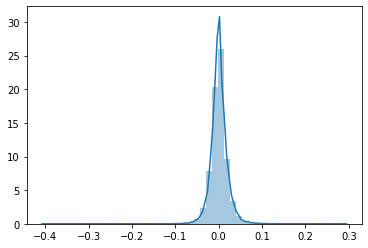

In [326]:
sns.distplot(selected_return.values.reshape(1,-1))

In [ ]:
selected_return.values.reshape(1,-1)

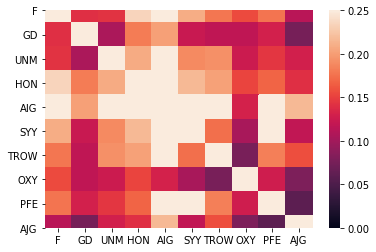

In [324]:
mpl.use('Agg')
x = sns.heatmap(
    selected_return.corr(), vmin=0, vmax=0.25
)


In [317]:
x

In [118]:
### Verify with pyportopt Covariance Matrix Generation Process
### Reformat Code
### Generator Return Matrices Format

In [133]:
return_df = pd.DataFrame(my_return.T, columns=['A', 'B', 'C', 'D', 'E'])

In [301]:
covgen = CovarianceGenerator(return_df)
covgen.calc_cov_mat(technique='sample', semi=False, method='default', unit_time=250, bm_return=2.5, assume_zero=False)
covgen.cov_mat

array([[ 0.02535133, -0.00571952,  0.01095335, -0.01132034,  0.00459716],
       [-0.00571952,  0.02642402, -0.0013918 , -0.01319953,  0.00414684],
       [ 0.01095335, -0.0013918 ,  0.04050849, -0.00572113,  0.00159273],
       [-0.01132034, -0.01319953, -0.00572113,  0.029573  , -0.00070889],
       [ 0.00459716,  0.00414684,  0.00159273, -0.00070889,  0.00935058]])

In [190]:
covgen.assets

Index(['F', 'GD', 'UNM', 'HON', 'AIG', 'SYY', 'TROW', 'OXY', 'PFE', 'AJG'], dtype='object')

In [302]:
covgen.cov_mat

NameError: name 'res_mat' is not defined

In [ ]:
covgen.cov_mat

In [142]:
covgen.calc_cov_mat(technique='sample', semi=False, method='exp', unit_time=250, bm_return=2.5, decay=0.95)
covgen.cov_mat

array([[ 2.44797310e-02, -6.08722197e-03,  1.02888933e-02,
        -1.08071962e-02,  3.78230120e-03],
       [-6.08722197e-03,  2.63983365e-02, -3.09308634e-04,
        -1.28221212e-02,  4.23960647e-03],
       [ 1.02888933e-02, -3.09308634e-04,  3.96537019e-02,
        -3.24729923e-03,  2.18333211e-03],
       [-1.08071962e-02, -1.28221212e-02, -3.24729923e-03,
         2.82550343e-02, -8.16519528e-05],
       [ 3.78230120e-03,  4.23960647e-03,  2.18333211e-03,
        -8.16519528e-05,  9.29737891e-03]])

In [122]:
covgen.calc_cov_mat(technique='sample', semi=True, method='default', unit_time=250, bm_return=0, assume_zero=False)
covgen.cov_mat

array([[ 7.99103610e-03,  1.95824342e-03,  0.00000000e+00,
         6.76302990e-04, -8.60027578e-04],
       [ 1.95824342e-03,  1.32413495e-03, -8.33035360e-05,
         1.33858924e-04, -2.35521759e-04],
       [ 0.00000000e+00, -8.33035360e-05,  1.15218004e-03,
         7.75840721e-05,  1.50616282e-04],
       [ 6.76302990e-04,  1.33858924e-04,  7.75840721e-05,
         4.25843306e-03,  3.77092928e-06],
       [-8.60027578e-04, -2.35521759e-04,  1.50616282e-04,
         3.77092928e-06,  2.85292140e-04]])

In [123]:
covgen.calc_cov_mat(technique='sample', semi=True, method='exp', unit_time=250, bm_return=0, decay=0.95, assume_zero=False)
covgen.cov_mat

array([[ 7.68406622e-03,  1.98520761e-03,  1.43394453e-05,
         9.80780982e-04, -7.03555396e-04],
       [ 1.98520761e-03,  1.46056059e-03, -8.11872420e-05,
         1.52226307e-04, -2.08821570e-04],
       [ 1.43394453e-05, -8.11872420e-05,  1.14912226e-03,
        -2.73914241e-05,  1.55021591e-04],
       [ 9.80780982e-04,  1.52226307e-04, -2.73914241e-05,
         3.90036075e-03, -1.34242998e-05],
       [-7.03555396e-04, -2.08821570e-04,  1.55021591e-04,
        -1.34242998e-05,  2.69722808e-04]])

In [143]:
covgen.calc_cov_mat(technique='EmpiricalCovariance', semi=True, method='exp', unit_time=250, bm_return=0, decay=0.95, assume_zero=False)
covgen.cov_mat

AttributeError: 'CovarianceGenerator' object has no attribute 'sk_technique'

In [230]:
dim = return_vec.shape
decay_mat = decay_factor ** np.linspace(tuple(np.arange(0,dim[1])), tuple(np.arange(0,dim[1])), dim[0])

In [238]:
decay_vec = decay_factor ** np.arange(0, dim[1])

In [256]:
# return_df = pd.DataFrame(return_vec.transpose(), columns=['A','B','C','D'])

In [139]:
###

def gen_rand_return(num_assets, num_obs, percentage=0.01, exp_return=0):
    return np.random.randn(num_assets, num_obs) * percentage + exp_return

def gen_rand_weights(n):
    k = np.random.rand(n)
    return k/np.sum(k)

In [140]:
gen_rand_weights(10)

array([0.15814873, 0.05731677, 0.06212474, 0.03320085, 0.09592375,
       0.13257335, 0.16853756, 0.12669267, 0.15579865, 0.00968293])

In [112]:
def numpy_ewma_vectorized(data, window):

    alpha = 2 /(window + 1.0)
    alpha_rev = 1-alpha

    scale = 1/alpha_rev
    n = data.shape[0]

    r = np.arange(n)
    scale_arr = scale**r
    offset = data[0]*alpha_rev**(r+1)
    pw0 = alpha*alpha_rev**(n-1)

    mult = data*pw0*scale_arr
    cumsums = mult.cumsum()
    out = offset + cumsums*scale_arr[::-1]
    return out

In [109]:
num_assets = 5
num_obs = 100

x_list = []
y_list = []

return_vec = gen_rand_return(num_assets, num_obs, exp_return=0.005)

for i in range(100000):

    weight = gen_rand_weights(num_assets)
    cov_mat = cov.EmpiricalCovariance().fit(return_vec.transpose()).covariance_
    mu, sigma = cal_mu_sigma(return_vec, weight, cov_mat)
    x_list.append(mu)
    y_list.append(sigma)
    

In [110]:
res_df = pd.DataFrame(columns=['return', 'volatility'])
res_df['return'] = x_list
res_df['volatility'] = y_list

In [111]:
px.scatter(res_df, x='volatility', y='return')

In [169]:
def numpy_ewma_vectorized(data, window):

    alpha = 2 /(window + 1.0)
    alpha_rev = 1-alpha

    scale = 1/alpha_rev
    n = data.shape[0]

    r = np.arange(n)
    scale_arr = scale**r
    offset = data[0]*alpha_rev**(r+1)
    pw0 = alpha*alpha_rev**(n-1)

    mult = data*pw0*scale_arr
    cumsums = mult.cumsum()
    out = offset + cumsums*scale_arr[::-1]
    return out

In [ ]:
def cal_mu_sigma(returns, weight, cov_mat):
    mu = np.dot(weight, np.mean(returns, 1).transpose())
    sigma = np.sqrt(np.linalg.multi_dot([weight, cov_mat, weight.transpose()]))
    return mu, sigma